<a href="https://colab.research.google.com/github/blueeagle100/stereo_vision_starter/blob/main/kitti_starter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Google Drive 연결

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### KITTI (2011/09/26 Driving Dataset) 다운

In [4]:
!wget https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_drive_0106/2011_09_26_drive_0106_sync.zip

--2024-11-11 13:57:08--  https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_drive_0106/2011_09_26_drive_0106_sync.zip
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 3.5.137.131, 52.219.47.99, 52.219.169.237, ...
Connecting to s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)|3.5.137.131|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 936875950 (893M) [application/zip]
Saving to: ‘2011_09_26_drive_0106_sync.zip’

2011_09_26_drive_01 100%[===================>] 893.47M  20.2MB/s    in 47s     

2024-11-11 13:57:55 (19.1 MB/s) - ‘2011_09_26_drive_0106_sync.zip’ saved [936875950/936875950]



### KITTI (2011/09/26 Driving Calibration) 다운

In [5]:
!wget https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_calib.zip

--2024-11-11 13:57:55--  https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_calib.zip
Resolving s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)... 3.5.136.9, 52.219.170.65, 3.5.134.250, ...
Connecting to s3.eu-central-1.amazonaws.com (s3.eu-central-1.amazonaws.com)|3.5.136.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4068 (4.0K) [application/zip]
Saving to: ‘2011_09_26_calib.zip’

2011_09_26_calib.zi 100%[===================>]   3.97K  --.-KB/s    in 0s      

2024-11-11 13:57:56 (151 MB/s) - ‘2011_09_26_calib.zip’ saved [4068/4068]



### Unzip

In [ ]:
!jar xf 2011_09_26_drive_0106_sync.zip
!jar xf 2011_09_26_calib.zip

### Library Import

In [8]:
import os
from glob import glob
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = (20, 10)

### Get data

In [9]:
DATA_PATH = r'2011_09_26/2011_09_26_drive_0106_sync'

left_image_paths = sorted(glob(os.path.join(DATA_PATH, 'image_02/data/*.png')))
right_image_paths = sorted(glob(os.path.join(DATA_PATH, 'image_03/data/*.png')))

print(f"Number of left images: {len(left_image_paths)}")
print(f"Number of right images: {len(right_image_paths)}")

Number of left images: 227
Number of right images: 227


### Visualize the data

In [10]:
index = 80

left_image = cv2.cvtColor(cv2.imread(left_image_paths[index]), cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(cv2.imread(right_image_paths[index]), cv2.COLOR_BGR2RGB)

print(f"The shape of an image is: {left_image.shape}")

The shape of an image is: (375, 1242, 3)


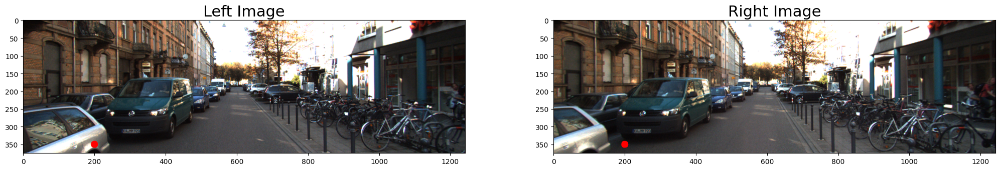

In [ ]:
# draw a point of interest
location = (200, 350)

cv2.circle(left_image, location, 10, [255, 0, 0], -1)
cv2.circle(right_image, location, 10, [255, 0, 0], -1)

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 15))
ax1.imshow(left_image)
ax1.set_title('Left Image', size=22)
ax2.imshow(right_image)
ax2.set_title('Right Image', size=22);

두 이미지가 매우 비슷해 보이지만 미묘한 차이가 있습니다.

Left Image에서 빨간 점 좌표 (200, 350) 위치를 기준과 Right Image에서 빨간 점 좌표 (200, 350)를 보면 해당 지점이 몇 픽셀 차이 나는 것을 확인

이 차이를 Disparity(시차)라 합니다. 시차는 Depth(깊이)와 반비례 관계에 있어, 이 점을 이용해 Stereo vision에서 물체의 깊이를 계산할 수 있습니다.

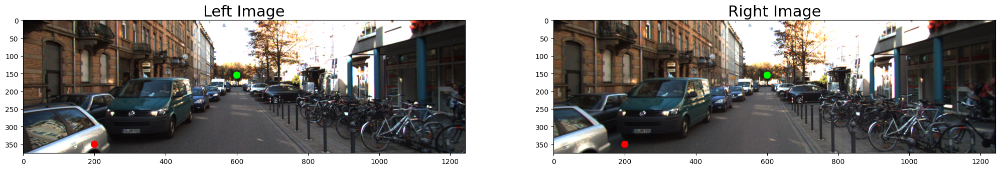

In [12]:
# draw a point of interest
location_2 = (600, 155)

cv2.circle(left_image, location_2, 10, [0, 255, 0], -1)
cv2.circle(right_image, location_2, 10, [0, 255, 0], -1)

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 15))
ax1.imshow(left_image)
ax1.set_title('Left Image', size=22)
ax2.imshow(right_image)
ax2.set_title('Right Image', size=22);

### Stereo SGBM(Semi Global Matching)

SGBM을 활용하여 시차(Disparity) 계산

- P1 : 시차 1픽셀 차이시 패널티
- P2 : 시차가 크게날시 패널티
    
    (P2는 P1 보다 큰 값으로 설정하여 시차가 크게날 상황을 억제)
    
- cv2.STEREO_SGBM_MODE_SGBM_3WAY : 왼쪽-오른쪽 이미지 매칭을 세방향(왼쪽-오른쪽, 상단-하단, 대각선)으로 수행

In [ ]:
def compute_sgbm_disparity(left_image, right_image, num_disparities=5*16, # num_disparities=5*16 80픽셀까지의 시차
                           block_size=11, window_size=5, display=False):
    """ SGBM 알고리즘을 사용하여 완쪽 오른쪽 이미지의 시차를 계산합니다.
    """
    # P1, P2 페널티
    P1 = 8 * 3 * window_size**2
    P2 = 32 * 3 * window_size**2
    sgbm_obj = cv2.StereoSGBM_create(0, num_disparities, block_size,
        P1, P2, mode=cv2.STEREO_SGBM_MODE_SGBM_3WAY)

    # 시차 계산
    disparity = sgbm_obj.compute(left_image, right_image).astype(np.float32)/16.0

    # 시각화
    if display:
      plt.figure(figsize = (40,20))
      plt.imshow(disparity, cmap='cividis')
      plt.title('Disparity Map', size=25)
      plt.show();

    return disparity

In [14]:
left_image_gray = cv2.cvtColor(left_image, cv2.COLOR_RGB2GRAY)
right_image_gray = cv2.cvtColor(right_image, cv2.COLOR_RGB2GRAY)

### 시차 파라미터 조정 및 시각화

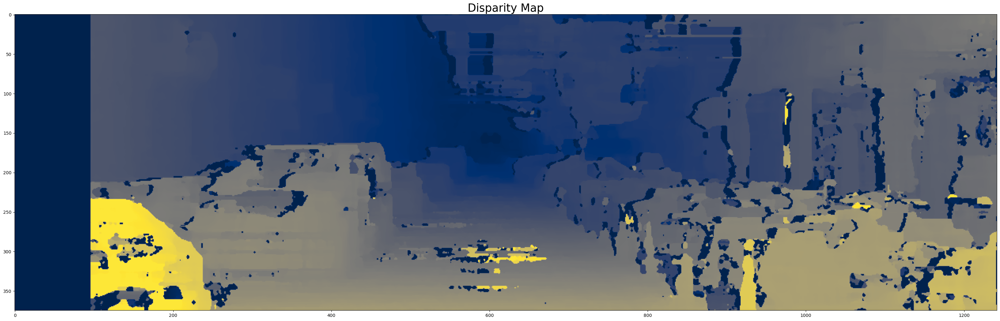

In [15]:
from IPython.display import Image
from ipywidgets import interact, interactive, fixed

disparity = interactive(compute_sgbm_disparity,
                        left_image=fixed(left_image_gray),
                        right_image=fixed(right_image_gray),
                        num_disparities=(0,512,16),
                        block_size=(1,19,2),
                        window_size=(1,13,2),
                        display=fixed(True))
display(disparity)

### 시차 파라미터

In [16]:
num_disparities = disparity.kwargs['num_disparities']
block_size = disparity.kwargs['block_size']
window_size = disparity.kwargs['window_size']

In [17]:
disparity = compute_sgbm_disparity(left_image_gray,
                                   right_image_gray,
                                   num_disparities,
                                   block_size,
                                   window_size,
                                   display=False)

### Depth 계산

In [18]:
with open('2011_09_26/calib_cam_to_cam.txt','r') as f:
    calib = f.readlines()

P_left = np.array([float(x) for x in calib[25].strip().split(' ')[1:]]).reshape((3,4))
P_right = np.array([float(x) for x in calib[33].strip().split(' ')[1:]]).reshape((3,4))

print('left projection matrix')
print(P_left)

print()
print('right projection matrix')
print(P_right)

left projection matrix
[[7.215377e+02 0.000000e+00 6.095593e+02 4.485728e+01]
 [0.000000e+00 7.215377e+02 1.728540e+02 2.163791e-01]
 [0.000000e+00 0.000000e+00 1.000000e+00 2.745884e-03]]

right projection matrix
[[ 7.215377e+02  0.000000e+00  6.095593e+02 -3.395242e+02]
 [ 0.000000e+00  7.215377e+02  1.728540e+02  2.199936e+00]
 [ 0.000000e+00  0.000000e+00  1.000000e+00  2.729905e-03]]


##### K = 내부 캘리브레이션 행렬(Intrinsic Calibration Matrix, K)
##### R = 회전 행렬(Rotation Matrix, R)
##### T = 변환 행렬(Translation Matrix, T)

In [19]:
def decompose_projection_matrix(P):
    K, R, T, _, _, _, _ = cv2.decomposeProjectionMatrix(P)
    T = T/T[3]

    return K, R, T

##### z(depth) = 깊이 (meters)

##### d(disparity) = 시차 (pixels)

##### T(baseline) = 두 카메라 간의 거리

##### f(focal length) = 카메라 렌즈에서 이미지 센서까지의 거리


### $$ z = \frac{f \cdot T}{d} $$

In [ ]:
def calc_depth_map(disp_left, K_left, T_left, T_right):
    # focal lenght
    f = K_left[0, 0]
    # baseline
    b = np.abs(T_left[0] - T_right[0])[0]
    # 시차 값이 0 or -1 경우 최소값으로 대체 (0 or -1로 나누기 방지)
    disp_left[disp_left <= 0] = 1e-5
    
    depth_map = f*b / disp_left

    return depth_map

In [ ]:
# K, R, T 추출
K_left, R_left, T_left = decompose_projection_matrix(P_left)
K_right, R_right, T_right = decompose_projection_matrix(P_right)

In [22]:
K_left

array([[721.5377,   0.    , 609.5593],
       [  0.    , 721.5377, 172.854 ],
       [  0.    ,   0.    ,   1.    ]])

In [23]:
depth_map = calc_depth_map(disparity, K_left, T_left, T_right)

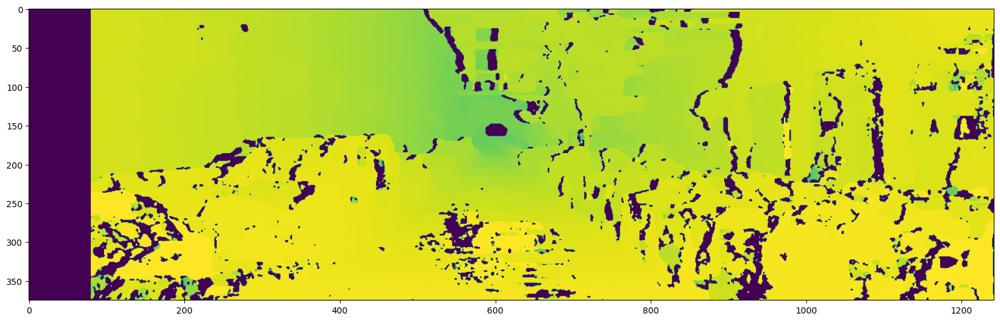

In [ ]:
# 시각화 위해 log 값
plt.imshow(np.log(depth_map), cmap='viridis_r'); # 'cividis_r' or 'cividis' 사용 가능

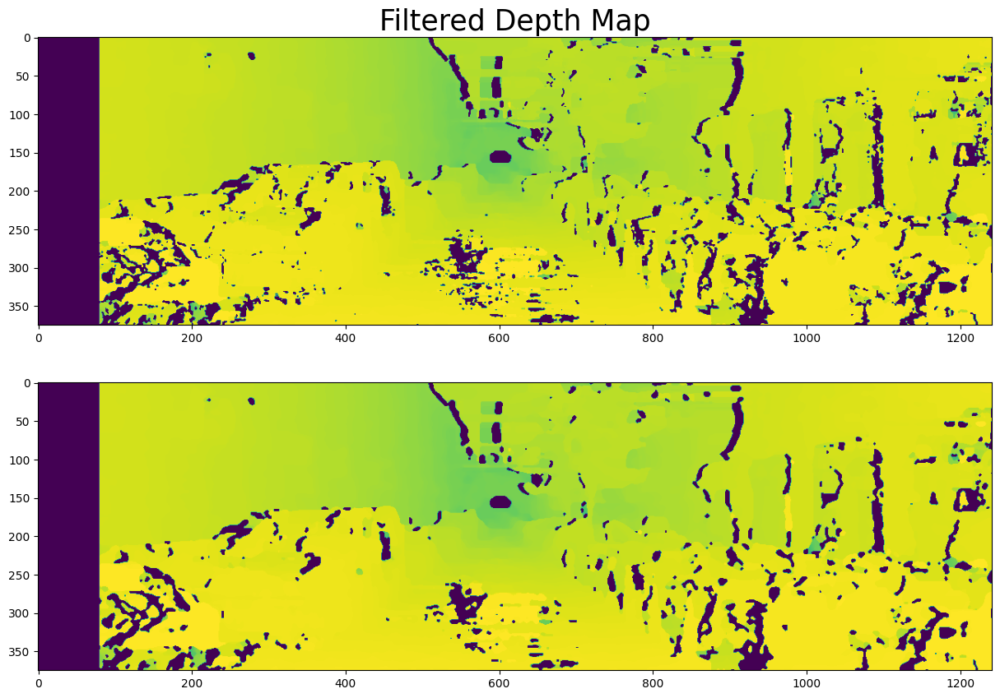

In [25]:
filtered_depth_map = cv2.medianBlur(depth_map, 5)

_, ax = plt.subplots(2, 1, figsize=(15, 10))
ax[0].imshow(np.log(depth_map), cmap='viridis_r')
ax[0].set_title('Original Depth Map', size=25)
ax[1].imshow(np.log(filtered_depth_map), cmap='viridis_r')
ax[0].set_title('Filtered Depth Map', size=25);

물체 간 거리 차이가, 뒤로 갈수록 깊이의 차이를 확인할 수 있습니다. 추가적인 미디안 블러 필터를 사용하면 노이즈가 더 줄어 들어 부드러운 이미지를 볼 수 있습니다.

### Object Detection with YOLOv8

In [26]:
from glob import glob
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt
import torch
import os
print(torch.cuda.is_available())

True


### YOLOv8

In [27]:
!pip -q install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 34.1/235.7 GB disk)


### Google Drive KITTI Dataset Unzip

In [28]:
!unzip -q /content/drive/MyDrive/Kit/kitti.zip -d /content/drive/MyDrive/Kit/kitti.zip

checkdir:  cannot create extraction directory: /content/drive/MyDrive/Kit/kitti.zip
           File exists


In [29]:
import zipfile
import os

# 압축 파일 경로와 압축을 풀 위치 설정
zip_path = '/content/drive/MyDrive/Kit/kitti.zip'
extract_path = '/content/drive/MyDrive/Kit/kitti_data'

# 폴더가 없으면 생성
os.makedirs(extract_path, exist_ok=True)

# 압축 해제 여부 확인
if not os.listdir(extract_path):  # 폴더가 비어있다면 압축 해제
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("압축 해제가 완료되었습니다.")
else:
    print("압축이 이미 해제되어 있습니다.")


압축이 이미 해제되어 있습니다.


In [30]:
import os
DATASET_DEFAULT_DIR = '/content/drive/MyDrive/Kit/kitti_data/kitti'

In [ ]:
# 데이터 개수 확인
modes = ['train', 'valid', 'test']
images, labels = [], []
for mode in modes:
    images.extend(sorted(glob(f'{DATASET_DEFAULT_DIR}/{mode}/images/*')))
    labels.extend(sorted(glob(f'{DATASET_DEFAULT_DIR}/{mode}/labels/*')))
print(f"# of images {len(images)}, # of labels {len(labels)}")

# of images 7464, # of labels 7464


In [32]:
DATASET_DEFAULT_DIR = '/content/drive/MyDrive/Kit/kitti_data/kitti'

mode = 'test'
images = sorted(glob(f'{DATASET_DEFAULT_DIR}/{mode}/images/*'))
labels = sorted(glob(f'{DATASET_DEFAULT_DIR}/{mode}/labels/*'))

sample_image = images[10]
print(f"Image Shape: {cv2.cvtColor(cv2.imread(sample_image), cv2.COLOR_BGR2RGB).shape}")

Image Shape: (375, 1242, 3)


### YOLOv8 Train

In [ ]:
from ultralytics import YOLO
# Load Pretrained Network
model = YOLO(model='yolov8s.pt')

# Transfer Learning
model = model.train(
    data=f"{DATASET_DEFAULT_DIR}/data.yaml",
    epochs=200,
    batch=32,
    optimizer='Adam',
    name='yolov8s',
    device=[0],
    imgsz=[1245, 375]
)

100%|██████████| 21.5M/21.5M [00:00<00:00, 173MB/s]


Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/Kit/kitti_data/kitti/data.yaml, epochs=200, time=None, patience=100, batch=32, imgsz=[1245, 375], save=True, save_period=-1, cache=False, device=[0], workers=8, project=None, name=yolov8s, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

100%|██████████| 755k/755k [00:00<00:00, 86.3MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 322MB/s]


AMP: checks passed ✅
WARNING ⚠️ updating to 'imgsz=1245'. 'train' and 'val' imgsz must be an integer, while 'predict' and 'export' imgsz may be a [h, w] list or an integer, i.e. 'yolo export imgsz=640,480' or 'yolo export imgsz=640'
WARNING ⚠️ imgsz=[1245] must be multiple of max stride 32, updating to [1248]


train: Scanning /content/drive/MyDrive/Kit/kitti_data/kitti/train/labels.cache... 5223 images, 1 backgrounds, 0 corrupt: 100%|██████████| 5223/5223 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/drive/MyDrive/Kit/kitti_data/kitti/valid/labels.cache... 1495 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1495/1495 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8s/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1248 train, 1248 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8s
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      30.5G      1.447      1.901      1.283        173       1248: 100%|██████████| 164/164 [10:05<00:00,  3.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]


                   all       1495       8018      0.441      0.199      0.184     0.0937

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      29.7G      1.376      1.238      1.271        177       1248: 100%|██████████| 164/164 [01:14<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.08it/s]


                   all       1495       8018      0.424      0.353      0.336       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      29.7G      1.293       1.12      1.219        121       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.86it/s]


                   all       1495       8018      0.558      0.376      0.392      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      31.9G      1.266      1.094      1.208        236       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]


                   all       1495       8018      0.582      0.392      0.431      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      30.8G      1.226      1.036      1.188        124       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.09it/s]


                   all       1495       8018      0.675      0.545      0.589      0.367

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      30.7G      1.205      1.008      1.181        140       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]


                   all       1495       8018      0.683      0.519      0.583      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200        32G      1.189     0.9796      1.167        194       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]


                   all       1495       8018      0.608       0.51      0.528      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      29.8G      1.169     0.9567      1.159        155       1248: 100%|██████████| 164/164 [01:12<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.05it/s]


                   all       1495       8018        0.7      0.549       0.62      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      29.7G      1.162     0.9482       1.16        103       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.35it/s]


                   all       1495       8018      0.639      0.532      0.587      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      30.9G      1.158     0.9386      1.154        162       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.06it/s]


                   all       1495       8018      0.717      0.531       0.59      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      30.1G      1.158      0.934      1.155        184       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018        0.7      0.546      0.603      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      29.7G      1.135     0.9156      1.142        207       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.685      0.582      0.634      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      29.8G      1.131     0.8983      1.137        142       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]


                   all       1495       8018      0.764      0.568      0.647      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      29.3G      1.127     0.9077      1.141        236       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.751      0.621      0.691      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      29.4G      1.125     0.8889      1.136        150       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]


                   all       1495       8018      0.747       0.59      0.676      0.448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      30.3G       1.12     0.8876      1.137        168       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]


                   all       1495       8018      0.758      0.626      0.706      0.467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      30.6G      1.107     0.8762      1.128        170       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]


                   all       1495       8018      0.753      0.616      0.692      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      29.4G      1.116     0.8762      1.134        189       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:08<00:00,  2.97it/s]


                   all       1495       8018      0.665      0.533      0.562       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      32.2G      1.115     0.8717      1.131        152       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]


                   all       1495       8018       0.77      0.625      0.705      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      29.4G      1.107     0.8649      1.128        131       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.30it/s]


                   all       1495       8018      0.749      0.627      0.708      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      29.6G      1.097     0.8587      1.124        227       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]


                   all       1495       8018      0.768       0.63      0.717      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      33.3G      1.096     0.8564      1.123        187       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


                   all       1495       8018      0.757       0.62      0.709       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      29.8G      1.088     0.8454      1.119         94       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018       0.78      0.648      0.728       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      31.2G      1.094     0.8548      1.124        166       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.10it/s]


                   all       1495       8018      0.795      0.673      0.753      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      29.3G      1.089     0.8463       1.12        170       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]


                   all       1495       8018      0.785      0.654      0.738        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      30.1G      1.088     0.8503      1.117        169       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]


                   all       1495       8018      0.782      0.612        0.7      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      32.4G      1.078     0.8311      1.111        229       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]


                   all       1495       8018      0.772      0.643      0.723      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      31.2G      1.077     0.8299      1.112        164       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]


                   all       1495       8018      0.796      0.658      0.747        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      30.7G       1.08      0.827      1.112        215       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]


                   all       1495       8018      0.794      0.665      0.748      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      31.8G      1.072     0.8304      1.113        251       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]


                   all       1495       8018      0.784      0.657      0.743      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      29.6G      1.079     0.8351      1.118        187       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]


                   all       1495       8018      0.764      0.633      0.715      0.478

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      30.8G      1.073     0.8227      1.111        169       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]

                   all       1495       8018      0.768      0.662      0.746        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      29.6G      1.066     0.8198      1.108        302       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


                   all       1495       8018      0.782       0.68      0.755      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      31.5G      1.068     0.8196       1.11        156       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.35it/s]


                   all       1495       8018      0.813      0.682      0.765      0.517

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      29.6G      1.059     0.8118      1.105        166       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]


                   all       1495       8018       0.78      0.653      0.745      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      29.5G      1.068     0.8133      1.109        103       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.829      0.688      0.775      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      31.1G      1.062     0.8147      1.107        136       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]


                   all       1495       8018      0.804      0.705      0.787      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      29.4G      1.053        0.8      1.101        216       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]


                   all       1495       8018      0.799      0.669       0.77      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      29.6G       1.06     0.8084      1.106        237       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]


                   all       1495       8018      0.815      0.683      0.778       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      33.2G      1.061     0.8071      1.106        201       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.809      0.668      0.766      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      30.6G      1.055     0.8014      1.104        188       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]


                   all       1495       8018      0.824      0.674      0.781      0.537

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      31.1G      1.046     0.7902      1.098        175       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.30it/s]


                   all       1495       8018      0.802      0.698      0.773      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      30.5G      1.044     0.7904      1.098        115       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]


                   all       1495       8018      0.815      0.677      0.778      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      30.8G      1.043     0.7906      1.093        209       1248: 100%|██████████| 164/164 [01:13<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]


                   all       1495       8018      0.819      0.684      0.767      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      32.1G      1.056     0.7981      1.105        130       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]


                   all       1495       8018      0.837      0.694      0.793      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      29.7G      1.042     0.7833      1.095        223       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.12it/s]

                   all       1495       8018      0.792      0.685      0.779      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      31.2G       1.04     0.7804      1.094        153       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018       0.82      0.708        0.8      0.555

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      30.9G      1.043     0.7836      1.096        184       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]


                   all       1495       8018      0.827        0.7      0.796      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      30.8G      1.034     0.7732      1.088        163       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.13it/s]


                   all       1495       8018      0.823      0.714      0.806      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      32.3G      1.038     0.7789      1.091        176       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.35it/s]


                   all       1495       8018      0.816      0.709      0.792       0.54

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      30.9G       1.03     0.7685      1.088        231       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]


                   all       1495       8018      0.832      0.721      0.811      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200        31G      1.026     0.7672      1.087        159       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]


                   all       1495       8018      0.847      0.729      0.824       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      30.5G      1.025     0.7686      1.085        144       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.30it/s]


                   all       1495       8018       0.84      0.716      0.813      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      32.1G      1.026       0.76      1.084        166       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.11it/s]


                   all       1495       8018      0.846      0.722      0.823      0.575

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      32.1G      1.025      0.763      1.082        205       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018      0.832      0.749      0.832      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      29.7G      1.028     0.7659      1.086        207       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]


                   all       1495       8018      0.824      0.737      0.819      0.572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      29.8G      1.019     0.7536      1.082        156       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.13it/s]


                   all       1495       8018       0.85      0.708      0.803      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      29.6G      1.016      0.756      1.079        200       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018      0.842      0.733      0.831      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      32.2G      1.016     0.7489      1.079        242       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]


                   all       1495       8018      0.828      0.729      0.819      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      29.5G       1.02     0.7621      1.084        203       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.825      0.735       0.82      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      32.6G      1.012     0.7513      1.081        182       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]


                   all       1495       8018      0.836       0.76      0.831      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      29.9G      1.008     0.7405      1.074        178       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]


                   all       1495       8018      0.861      0.743      0.836      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      30.5G      1.004     0.7397      1.074        207       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.28it/s]


                   all       1495       8018      0.852      0.747      0.835      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      29.4G       1.01     0.7437       1.08        146       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.28it/s]


                   all       1495       8018      0.856      0.765      0.846        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      31.2G     0.9979     0.7337       1.07        171       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]


                   all       1495       8018      0.863      0.747      0.843      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      30.7G      1.005     0.7388      1.072        239       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]


                   all       1495       8018      0.854      0.757      0.843      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      29.3G      1.005     0.7413      1.074        156       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.832      0.773      0.845      0.602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      29.4G      0.996     0.7319      1.069        183       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.21it/s]


                   all       1495       8018      0.867      0.738       0.83      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      30.6G     0.9965     0.7262      1.068        161       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]


                   all       1495       8018       0.85      0.778      0.856      0.612

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      29.9G     0.9995     0.7284       1.07        170       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]


                   all       1495       8018      0.871      0.766      0.853      0.608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      29.6G     0.9945     0.7283      1.067        165       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]


                   all       1495       8018      0.847      0.754      0.845      0.599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      30.5G     0.9866     0.7182      1.066        141       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018      0.863      0.769      0.855      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      30.8G     0.9961     0.7268      1.068        149       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]


                   all       1495       8018      0.863      0.782      0.858      0.615

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200        31G     0.9868     0.7226      1.067        165       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.36it/s]

                   all       1495       8018      0.859      0.762      0.849      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      29.8G     0.9945     0.7271      1.067        131       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


                   all       1495       8018      0.889      0.761      0.862      0.623

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      29.6G     0.9905     0.7207      1.063        196       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]


                   all       1495       8018       0.85       0.78      0.857      0.616

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      30.7G     0.9848     0.7165      1.063        100       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.37it/s]


                   all       1495       8018      0.875      0.767      0.856      0.619

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      32.1G     0.9825     0.7145      1.062        139       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]


                   all       1495       8018      0.869       0.78      0.866      0.624

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      31.3G     0.9806     0.7115      1.061        110       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]


                   all       1495       8018      0.882      0.768      0.857      0.621

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      32.6G     0.9824     0.7132      1.062        142       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018      0.862      0.774      0.864      0.627

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      31.1G     0.9703     0.7068      1.056        251       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]

                   all       1495       8018      0.875      0.795      0.869      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      30.6G     0.9798     0.7098       1.06        127       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.41it/s]


                   all       1495       8018      0.871       0.78      0.865      0.626

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      32.1G     0.9767     0.7036      1.058        216       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018      0.865      0.795       0.87      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      29.7G     0.9701     0.7036      1.055        139       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018      0.885      0.784      0.871      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      30.5G     0.9754      0.706      1.057        209       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]


                   all       1495       8018      0.877      0.792       0.87      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      29.3G     0.9716      0.702      1.057        169       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


                   all       1495       8018      0.889      0.793      0.876      0.638

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      30.3G     0.9716        0.7      1.057        171       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]


                   all       1495       8018      0.882      0.789      0.873      0.633

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      31.2G     0.9669     0.6966      1.054        130       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.28it/s]


                   all       1495       8018      0.867      0.802      0.877      0.641

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      30.9G      0.965     0.6954      1.053        203       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]

                   all       1495       8018      0.868      0.802      0.876      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      31.6G     0.9618     0.6913      1.052        180       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]


                   all       1495       8018      0.893      0.793      0.879      0.642

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      30.1G     0.9626     0.6922      1.049        310       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]


                   all       1495       8018      0.887       0.79      0.874      0.637

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      29.2G     0.9629     0.6917      1.054        195       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]


                   all       1495       8018      0.876      0.792      0.877      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      30.6G     0.9594     0.6896       1.05        210       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]

                   all       1495       8018      0.891      0.792       0.88      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      30.5G     0.9563     0.6852      1.047        160       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]

                   all       1495       8018      0.907      0.787      0.883      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      30.8G     0.9527     0.6805      1.046        210       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]


                   all       1495       8018      0.886      0.798       0.88      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      29.6G     0.9525     0.6809      1.044        182       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]

                   all       1495       8018       0.89      0.797      0.879      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      28.7G     0.9519     0.6817      1.046        176       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]


                   all       1495       8018       0.88      0.807      0.883      0.647

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      30.8G     0.9511     0.6814      1.043        101       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]

                   all       1495       8018      0.887      0.799      0.884      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      29.6G     0.9452     0.6731      1.044        203       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]


                   all       1495       8018      0.892      0.806      0.888      0.656

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      29.6G     0.9501     0.6753      1.044        179       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]


                   all       1495       8018      0.892      0.803      0.886      0.657

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      31.8G     0.9425     0.6746      1.041        243       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.35it/s]

                   all       1495       8018      0.886      0.805      0.883      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      29.2G     0.9469     0.6741      1.042        144       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]


                   all       1495       8018      0.896      0.804      0.889       0.66

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200        32G     0.9424     0.6765      1.043        178       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018      0.906      0.807       0.89      0.661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      29.3G     0.9404     0.6663      1.042        157       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018      0.889      0.815      0.889      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      30.6G     0.9407     0.6677      1.039        200       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]

                   all       1495       8018      0.901      0.806       0.89      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      32.2G     0.9399     0.6714      1.041        115       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.41it/s]

                   all       1495       8018       0.91      0.809      0.893      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      30.6G     0.9315     0.6586      1.036        183       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]


                   all       1495       8018      0.894      0.814      0.891      0.661

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      30.9G     0.9335     0.6617      1.035        170       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018      0.898      0.813      0.892       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      31.9G     0.9296     0.6547      1.033        189       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]

                   all       1495       8018      0.891      0.821      0.893      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      30.5G     0.9319     0.6575      1.034        249       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]

                   all       1495       8018      0.894      0.823      0.893      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      28.9G     0.9301     0.6552      1.035        141       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018      0.896      0.819      0.892      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      29.4G     0.9279     0.6557      1.036        197       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]

                   all       1495       8018      0.898      0.824      0.896      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      29.2G     0.9248      0.652      1.031        171       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]

                   all       1495       8018      0.906      0.811      0.894      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      29.7G     0.9213     0.6492      1.029        163       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]


                   all       1495       8018      0.903      0.817      0.895      0.669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      30.8G      0.921     0.6483      1.028        258       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]

                   all       1495       8018      0.892      0.821      0.896      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      28.8G     0.9163     0.6456      1.027        245       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.21it/s]


                   all       1495       8018      0.898      0.819        0.9      0.672

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      29.2G     0.9201     0.6484       1.03        139       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.35it/s]

                   all       1495       8018      0.906      0.817      0.896      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      31.3G     0.9122     0.6396      1.023        159       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]

                   all       1495       8018      0.906      0.819      0.897      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200        31G     0.9124     0.6386      1.023        111       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]

                   all       1495       8018      0.907       0.82      0.898      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200        32G     0.9106     0.6357      1.024        252       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.36it/s]


                   all       1495       8018      0.884      0.833      0.898      0.673

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      29.6G     0.9132     0.6401      1.025        138       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.21it/s]

                   all       1495       8018      0.899      0.821      0.899      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200        32G     0.9083     0.6311      1.022        243       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]

                   all       1495       8018      0.902      0.829      0.901      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200        31G     0.9108      0.637      1.027        207       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]

                   all       1495       8018      0.912      0.828        0.9      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200        31G     0.9062     0.6299      1.021        158       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]


                   all       1495       8018      0.897      0.831      0.901      0.679

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200        31G     0.9043     0.6297      1.022        166       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]


                   all       1495       8018      0.904       0.83      0.902      0.678

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      29.8G     0.9032     0.6284       1.02        173       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]

                   all       1495       8018      0.906      0.831      0.901      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      29.7G     0.9013     0.6225       1.02        208       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]

                   all       1495       8018      0.906       0.83      0.903      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      29.7G     0.8929     0.6193      1.016        217       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018      0.914      0.826      0.903       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      29.5G      0.892     0.6171      1.013        224       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.18it/s]


                   all       1495       8018      0.918      0.828      0.906      0.681

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200        30G     0.8988     0.6223      1.016        154       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.42it/s]

                   all       1495       8018      0.922      0.825      0.907      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      32.1G      0.895     0.6212      1.015        202       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.21it/s]

                   all       1495       8018        0.9      0.833      0.906      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      29.6G     0.8894     0.6105      1.011        223       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018        0.9       0.84      0.906      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      33.3G     0.8915     0.6174      1.013        185       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018      0.905      0.839      0.906      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      29.5G     0.8921      0.619      1.015        177       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]

                   all       1495       8018      0.894      0.841      0.906      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      28.1G     0.8953     0.6189      1.018        125       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.37it/s]

                   all       1495       8018      0.906      0.833      0.905      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      29.5G     0.8838     0.6046      1.009        168       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018      0.904      0.834      0.906      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      29.8G     0.8869     0.6106      1.013        134       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]

                   all       1495       8018      0.897      0.841      0.906      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      31.3G     0.8777     0.6028      1.009        182       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.37it/s]

                   all       1495       8018       0.89      0.849      0.908      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      29.8G     0.8817     0.6046      1.009        129       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]

                   all       1495       8018      0.902      0.842       0.91      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      31.2G     0.8778     0.6017      1.008        162       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018      0.905      0.841       0.91      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      29.8G       0.87     0.5964      1.006        179       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.30it/s]

                   all       1495       8018      0.912      0.841      0.912       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      29.2G     0.8728      0.597      1.005        163       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]

                   all       1495       8018      0.911      0.838      0.911      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      29.7G     0.8725     0.5943      1.004        175       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.43it/s]

                   all       1495       8018       0.91      0.842      0.911      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200        29G     0.8704     0.5961      1.003        237       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]

                   all       1495       8018      0.906      0.846      0.913      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      29.4G     0.8675     0.5943      1.002        170       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]

                   all       1495       8018      0.907      0.851      0.912      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      27.9G      0.868     0.5936      1.001        169       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]

                   all       1495       8018      0.912      0.847      0.913      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      30.6G     0.8656     0.5907      1.002        190       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.21it/s]


                   all       1495       8018      0.915      0.847      0.913      0.694

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      31.1G     0.8628     0.5879      0.999        194       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]

                   all       1495       8018      0.916      0.845      0.913      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      29.7G      0.859     0.5821      0.998        166       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018      0.912      0.846      0.913      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      31.5G     0.8542     0.5814     0.9961        119       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018      0.916      0.843      0.913      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      31.1G     0.8531     0.5799     0.9942        216       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]

                   all       1495       8018      0.915      0.848      0.915      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      32.3G     0.8567     0.5791      0.995        150       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]

                   all       1495       8018      0.922      0.841      0.914      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      32.4G     0.8528     0.5784     0.9942        173       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018       0.92      0.844      0.915      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      30.6G      0.852     0.5759     0.9948        172       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.28it/s]

                   all       1495       8018      0.918      0.846      0.915      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      29.7G     0.8494     0.5748     0.9923        142       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.23it/s]

                   all       1495       8018       0.92       0.85      0.915      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200        31G      0.845      0.569     0.9915        143       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018       0.92       0.85      0.916      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200        31G     0.8387     0.5684     0.9909        150       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]

                   all       1495       8018      0.918      0.848      0.917      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      30.3G     0.8401      0.564     0.9879        187       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]

                   all       1495       8018      0.907      0.859      0.919      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      31.6G     0.8409     0.5677     0.9907        173       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.27it/s]

                   all       1495       8018      0.911      0.856      0.919      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      29.6G     0.8325     0.5607     0.9872        206       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]

                   all       1495       8018      0.912      0.857      0.919      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      31.5G     0.8343     0.5599     0.9864        181       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.33it/s]


                   all       1495       8018      0.904      0.861       0.92      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      30.8G     0.8313     0.5608     0.9856        216       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.28it/s]

                   all       1495       8018      0.909      0.858      0.919      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      30.4G      0.831      0.555     0.9831        190       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018      0.907      0.859       0.92      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      29.3G     0.8224     0.5492     0.9808        140       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.30it/s]

                   all       1495       8018      0.906      0.859      0.919      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      30.6G     0.8248     0.5503     0.9806        179       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.14it/s]

                   all       1495       8018      0.906      0.859       0.92      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      29.6G     0.8208     0.5489     0.9802        192       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018      0.911      0.858       0.92      0.704



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200        30G     0.8194     0.5456     0.9811        220       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018      0.912      0.858       0.92      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      29.9G     0.8175     0.5429     0.9787        175       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018      0.919      0.855       0.92      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      31.9G     0.8132     0.5425     0.9787        210       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.38it/s]

                   all       1495       8018      0.908      0.863       0.92      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      29.7G     0.8123     0.5396     0.9739        162       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]

                   all       1495       8018      0.917      0.859      0.921      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      29.4G      0.807     0.5339     0.9746        198       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]

                   all       1495       8018      0.921      0.853      0.921      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      30.9G     0.8054     0.5334     0.9737        147       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]

                   all       1495       8018      0.915      0.857      0.921      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      29.3G     0.8037     0.5324     0.9713        141       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]

                   all       1495       8018      0.916      0.859      0.922       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      32.1G     0.8007     0.5286     0.9687        142       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.16it/s]

                   all       1495       8018       0.91      0.864      0.922       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      30.9G      0.797     0.5267     0.9675        193       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018      0.918       0.86      0.922      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      29.3G     0.7945     0.5266     0.9684        148       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]

                   all       1495       8018       0.92      0.858      0.922       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      30.5G     0.7954     0.5264     0.9698        165       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018      0.918      0.864      0.923      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      32.1G     0.7904     0.5209     0.9647        149       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018       0.92      0.862      0.923      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200        31G     0.7885     0.5198     0.9628        201       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.29it/s]

                   all       1495       8018      0.921      0.862      0.924      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      30.3G     0.7797     0.5111      0.961        195       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.36it/s]

                   all       1495       8018      0.918      0.864      0.924      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      29.9G     0.7824     0.5109     0.9606        136       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]

                   all       1495       8018      0.918      0.864      0.924      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      29.8G     0.7783     0.5111      0.961        148       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018      0.917      0.866      0.924      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      28.3G     0.7771     0.5089      0.961        179       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018      0.917      0.866      0.924      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      29.3G     0.7744     0.5072      0.959        171       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.20it/s]

                   all       1495       8018      0.919      0.865      0.925      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      32.2G     0.7711     0.5009     0.9546        224       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.25it/s]

                   all       1495       8018      0.921      0.865      0.925      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      29.7G     0.7673     0.5014     0.9555        169       1248: 100%|██████████| 164/164 [01:13<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]

                   all       1495       8018      0.924      0.863      0.925      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200        31G     0.7673      0.499     0.9559        147       1248: 100%|██████████| 164/164 [01:12<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.19it/s]

                   all       1495       8018      0.925      0.863      0.926      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200        30G     0.7591     0.4919     0.9516        135       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.31it/s]

                   all       1495       8018      0.926      0.861      0.926      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      28.2G     0.7577     0.4916     0.9496        131       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.17it/s]

                   all       1495       8018      0.927      0.861      0.926      0.714



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      32.5G     0.7545      0.487     0.9501        165       1248: 100%|██████████| 164/164 [01:13<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.37it/s]

                   all       1495       8018      0.929       0.86      0.927      0.716


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      28.3G     0.7828     0.5025     0.9683         72       1248: 100%|██████████| 164/164 [01:14<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.32it/s]

                   all       1495       8018       0.93      0.861      0.926      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      28.2G     0.7538     0.4755     0.9546         91       1248: 100%|██████████| 164/164 [01:10<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.24it/s]

                   all       1495       8018      0.929      0.862      0.927      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      27.7G     0.7466     0.4691     0.9504         69       1248: 100%|██████████| 164/164 [01:10<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018       0.93       0.86      0.927      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      27.5G     0.7372      0.463      0.949         95       1248: 100%|██████████| 164/164 [01:10<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]

                   all       1495       8018      0.928      0.863      0.927      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      28.2G     0.7363      0.461     0.9481         92       1248: 100%|██████████| 164/164 [01:11<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.22it/s]

                   all       1495       8018      0.928      0.863      0.928      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      28.1G     0.7299     0.4554     0.9431         75       1248: 100%|██████████| 164/164 [01:10<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.38it/s]

                   all       1495       8018      0.928      0.864      0.928      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      27.5G     0.7251      0.454     0.9436         88       1248: 100%|██████████| 164/164 [01:11<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.21it/s]

                   all       1495       8018      0.927      0.863      0.928      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      28.3G      0.718      0.448     0.9416         86       1248: 100%|██████████| 164/164 [01:10<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.43it/s]

                   all       1495       8018      0.928      0.863      0.928      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      28.3G     0.7162     0.4478     0.9407         73       1248: 100%|██████████| 164/164 [01:11<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.26it/s]

                   all       1495       8018      0.924      0.865      0.928      0.719



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      28.3G     0.7133     0.4426     0.9377         70       1248: 100%|██████████| 164/164 [01:11<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:07<00:00,  3.34it/s]

                   all       1495       8018      0.926      0.865      0.928       0.72



200 epochs completed in 4.672 hours.
Optimizer stripped from runs/detect/yolov8s/weights/last.pt, 22.6MB
Optimizer stripped from runs/detect/yolov8s/weights/best.pt, 22.6MB

Validating runs/detect/yolov8s/weights/best.pt...
Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 11,127,906 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:10<00:00,  2.29it/s]


                   all       1495       8018      0.925      0.866      0.928       0.72
                   Car       1336       5627      0.944      0.937      0.976      0.827
               Cyclist        227        330      0.884      0.839      0.896      0.645
                  Misc        226        309       0.91      0.825      0.904      0.713
                Person        374        957      0.936      0.749      0.874      0.526
                 Truck        219        230      0.941      0.939      0.966       0.82
                   Van        422        565      0.935      0.904      0.953      0.785
Speed: 0.2ms preprocess, 0.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/yolov8s


In [ ]:
# 신뢰도 및 IoU 임계값 설정
model.conf = 0.25  # 신뢰도 임계값 (0-1 사이 값), 기본값: 0.25
model.iou = 0.25  # NMS(비최대 억제) IoU 임계값 (0-1 사이 값), 기본값: 0.45


#### Detect objects

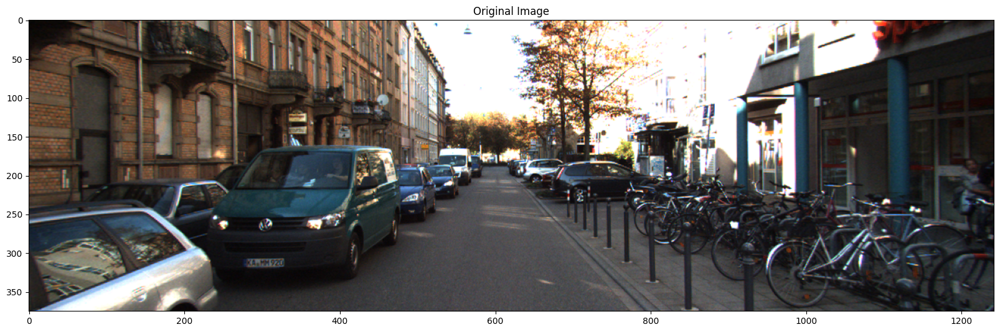

In [36]:
# Left image 로드
left_image = cv2.cvtColor(cv2.imread(left_image_paths[index]), cv2.COLOR_BGR2RGB)
plt.imshow(left_image)
plt.title("Original Image")
plt.show()


0: 384x1248 7 Cars, 1 Misc, 3 Vans, 58.6ms
Speed: 3.2ms preprocess, 58.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 1248)


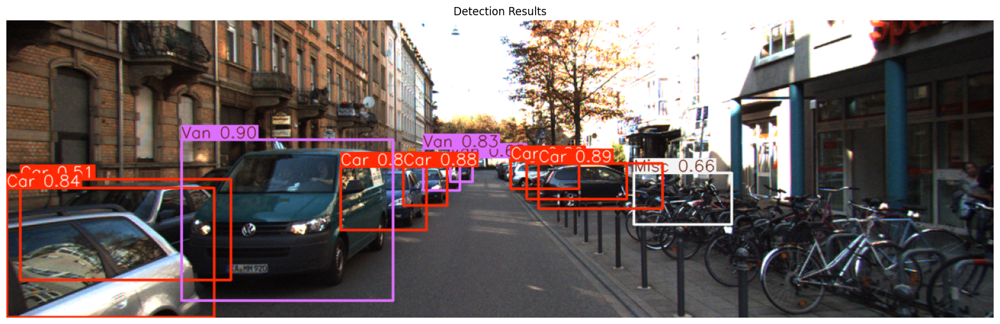

In [37]:
# 학습된 모델 로드
model = YOLO("runs/detect/yolov8s/weights/best.pt")  # 최적화된 모델 로드

# 추론 실행
results = model(left_image)

# 결과 시각화
annotated_image = results[0].plot()  # 결과가 그려진 이미지를 반환
plt.imshow(annotated_image)  # 결과 이미지 표시
plt.title("Detection Results")
plt.axis("off")
plt.show()

In [ ]:
def get_distances(image, depth_map, bboxes, method='median', draw=True):
    # depth_map 크기가 이미지 크기와 다른 경우, 스케일링 비율 계산
    scale_y = depth_map.shape[0] / image.shape[0]
    scale_x = depth_map.shape[1] / image.shape[1]

    for bbox in bboxes:
        # 바운딩 박스 좌표를 depth_map 크기에 맞게 스케일링
        pt1 = (bbox[0:2] * [scale_x, scale_y]).astype(int)  # (x_min, y_min)
        pt2 = (bbox[2:4] * [scale_x, scale_y]).astype(int)  # (x_max, y_max)

        # 바운딩 박스의 중심 위치 계산
        x_center = int((pt1[0] + pt2[0]) / 2)
        y_center = int((pt1[1] + pt2[1]) / 2)

        # 깊이 맵에서 바운딩 박스 영역 추출
        depth_slice = depth_map[pt1[1]:pt2[1], pt1[0]:pt2[0]]

        # 거리 계산 방식에 따라 거리 값 계산
        if method == 'center':
            # 바운딩 박스 중심의 깊이 값 사용
            x_c = (pt2[0] - pt1[0]) // 2
            y_c = (pt2[1] - pt1[1]) // 2
            stereo_depth = depth_slice[y_c, x_c]
        else:  # method == 'median'
            # 바운딩 박스 내부의 깊이 값의 중간값 사용
            stereo_depth = np.median(depth_slice)

        # 원본 이미지에 바운딩 박스를 그림
        if draw:
            cv2.rectangle(image, (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3])), (0, 255, 0), 2)  # 초록색 박스
            cv2.putText(image,
                        f'{stereo_depth:.2f} m',  # 거리 값을 텍스트로 표시 (소수점 2자리)
                        (int(bbox[0]), int(bbox[1]) - 10),  # 텍스트를 바운딩 박스 위에 표시
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.5,
                        (255, 0, 0), 2, cv2.LINE_AA)  # 파란색 텍스트

    return image



0: 384x1248 7 Cars, 1 Misc, 3 Vans, 10.2ms
Speed: 4.1ms preprocess, 10.2ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 1248)
Bounding boxes: [[     220.07      150.04      486.52         354]
 [     669.25       180.2       825.8      237.79]
 [     634.89       176.8      720.29      212.02]
 [     499.28      184.67      554.08      233.52]
 [        420      184.65      528.01      264.26]
 [    0.66139       211.4      261.81      374.58]
 [     524.78      161.81      570.69      214.99]
 [     654.55      180.54      780.07      225.27]
 [     789.14      192.15         912      257.36]
 [     558.67      173.46      586.41      203.22]
 [     17.818      200.57      282.93      327.38]]


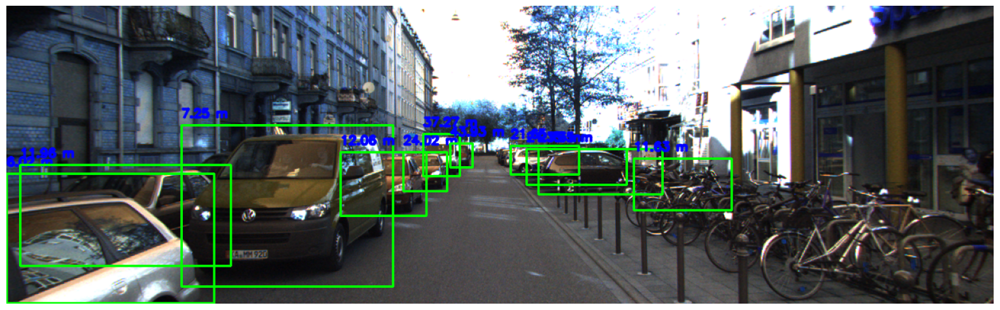

In [39]:
# 모델 예측
detections = model(left_image)

# 바운딩 박스 추출
if hasattr(detections[0], 'boxes') and detections[0].boxes is not None:
    bboxes = detections[0].boxes.xyxy.cpu().numpy()
    print("Bounding boxes:", bboxes)
else:
    raise ValueError("No bounding boxes detected.")

# 거리 측정 및 바운딩 박스 시각화
distance_image = left_image.copy()
distance_image = get_distances(distance_image, filtered_depth_map, bboxes, method='center')

# 결과 출력
plt.imshow(cv2.cvtColor(distance_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


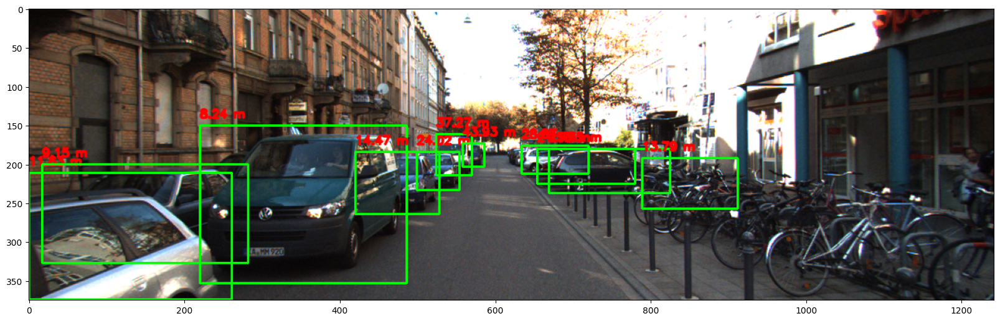

In [ ]:
# 길이 측정
distance_image = left_image.copy()

distance_image = get_distances(distance_image, filtered_depth_map, bboxes, method='median')
plt.imshow(distance_image);


0: 384x1248 8 Cars, 1 Misc, 9.7ms
Speed: 3.2ms preprocess, 9.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 1248)


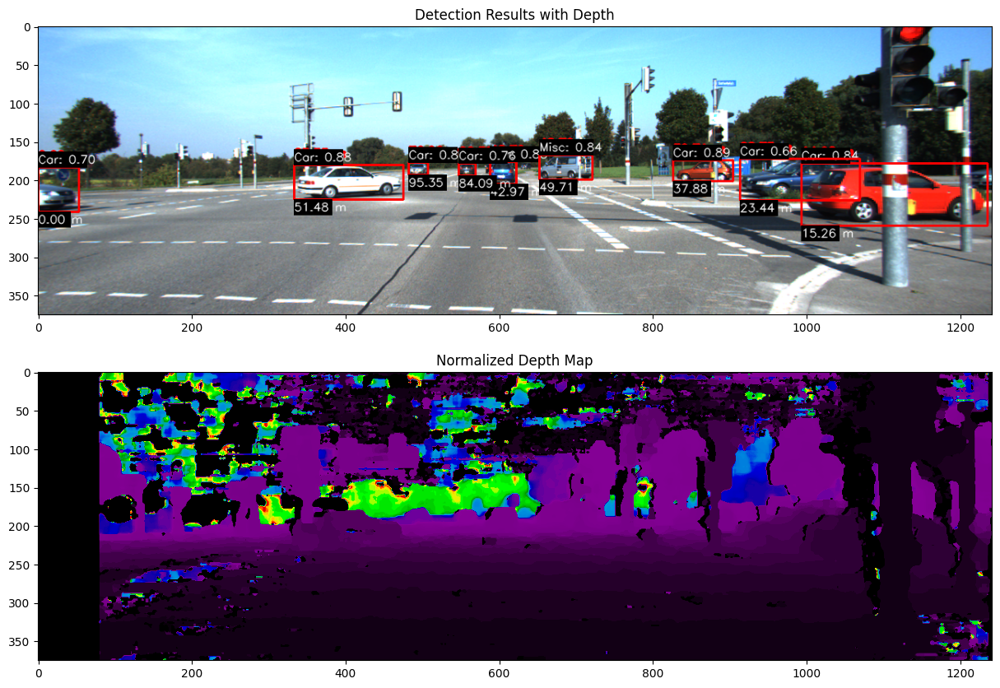

In [ ]:
def get_depth_detections(left_image, right_image, method='median', draw_boxes=True, draw_depth=True):
    # YOLO 모델 추론
    detections = model(left_image)

    # Disparity 맵 계산
    disparity_map = compute_sgbm_disparity(left_image, right_image)

    # 카메라 캘리브레이션 값
    focal_length = 721.5  # 픽셀 단위 (예: KITTI 데이터셋)
    baseline = 0.54       # 미터 단위 (예: KITTI 데이터셋)

    # 거리 맵 계산
    depth_map = np.zeros_like(disparity_map, dtype=np.float32)
    valid_disp = disparity_map > 0  # 유효한 disparity 값만 처리
    depth_map[valid_disp] = (focal_length * baseline) / disparity_map[valid_disp]

    # 정규화 및 반전 (시각화를 위해)
    normalized_depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map))

    # YOLO 감지 결과와 결합
    result = left_image.copy()
    if hasattr(detections[0], 'boxes') and detections[0].boxes is not None:
        bboxes = detections[0].boxes.xyxy.cpu().numpy()
        confidences = detections[0].boxes.conf.cpu().numpy()  # 확률값
        classes = detections[0].boxes.cls.cpu().numpy().astype(int)  # 클래스 인덱스
        class_names = model.names  # 클래스 이름

        result = get_distances(result, depth_map, bboxes, method=method)
        if draw_boxes:
            for bbox, conf, cls_idx in zip(bboxes, confidences, classes):
                x1, y1, x2, y2 = map(int, bbox)
                # 클래스 이름과 확률값
                label = f"{class_names[cls_idx]}: {conf:.2f}"
                # 깊이 값
                depth_label = f"{depth_map[y1:y2, x1:x2].mean():.2f} m"

                # 바운딩 박스 그리기
                cv2.rectangle(result, (x1, y1), (x2, y2), (255, 0, 0), 2)

                # 텍스트 배경 색 (클래스/확률)
                cv2.rectangle(result, (x1, y1 - 20), (x1 + len(label) * 7, y1), (0, 0, 0), -1)
                # 클래스/확률 텍스트
                cv2.putText(result, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

                # 텍스트 배경 색 (깊이 값)
                cv2.rectangle(result, (x1, y2), (x1 + len(depth_label) * 7, y2 + 20), (0, 0, 0), -1)
                # 깊이 값 텍스트
                cv2.putText(result, depth_label, (x1, y2 + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)


    return result, depth_map, normalized_depth_map, detections


index = 10
left_image = cv2.cvtColor(cv2.imread(left_image_paths[index]), cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(cv2.imread(right_image_paths[index]), cv2.COLOR_BGR2RGB)

result, depth_map, normalized_depth_map, _ = get_depth_detections(left_image, right_image, method='median')

_, ax = plt.subplots(2, 1, figsize=(15, 10))
ax[0].imshow(result)
ax[0].set_title("Detection Results with Depth")
ax[1].imshow(normalized_depth_map, cmap='nipy_spectral')
ax[1].set_title("Normalized Depth Map")
plt.show()



<ipython-input-42-96118af8d81a>:4: RuntimeWarning: divide by zero encountered in log
  ax[1].imshow(np.log(depth_map), cmap='nipy_spectral');


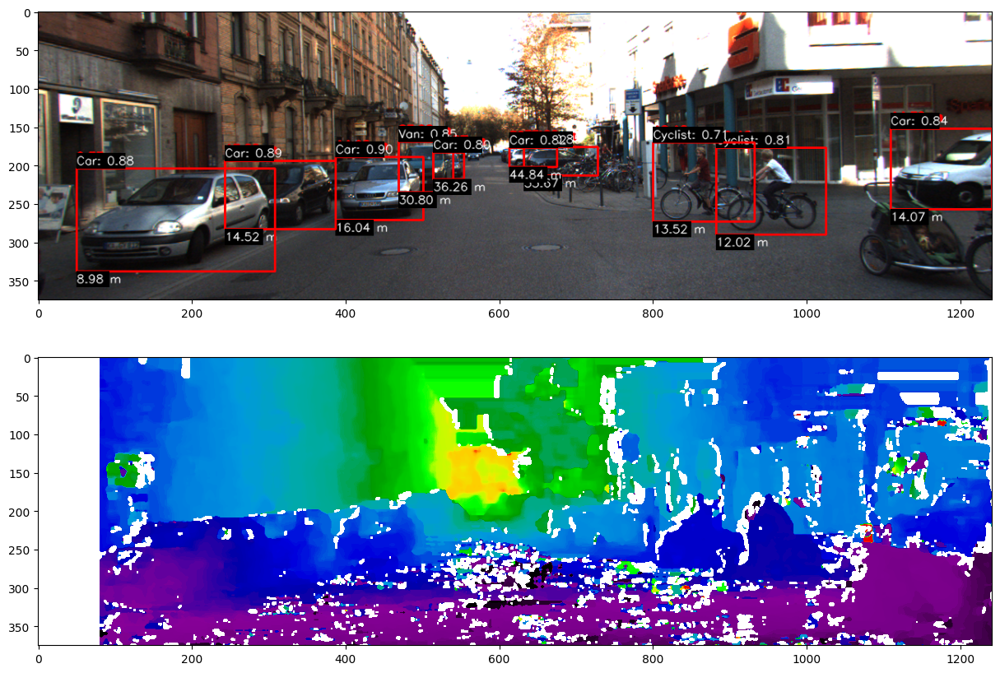

In [42]:
_, ax = plt.subplots(2, 1, figsize=(15, 10))

ax[0].imshow(result);
ax[1].imshow(np.log(depth_map), cmap='nipy_spectral');

## KITTI Dataset (Multi-object tracking) 시연 영상

#### Google Drive KITTI Dataset 불러오기

In [52]:
import zipfile
import os

# 압축 해제 함수
def unzip_file(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print(f"Extracted {zip_path} to {extract_to}")

# 파일 경로 설정
zip_l_path = "/content/drive/MyDrive/Kit/0010_L.zip"
zip_r_path = "/content/drive/MyDrive/Kit/0010_R.zip"

# 압축 해제 경로 설정
extract_l_path = "/content/drive/MyDrive/Kit/0010_L/"
extract_r_path = "/content/drive/MyDrive/Kit/0010_R/"

# 압축 해제 실행
unzip_file(zip_l_path, extract_l_path)
unzip_file(zip_r_path, extract_r_path)


Extracted /content/drive/MyDrive/Kit/0010_L.zip to /content/drive/MyDrive/Kit/0010_L/
Extracted /content/drive/MyDrive/Kit/0010_R.zip to /content/drive/MyDrive/Kit/0010_R/


In [54]:
# 압축 해제 결과 확인
print("Left images extracted:")
print(os.listdir(extract_l_path))

print("Right images extracted:")
print(os.listdir(extract_r_path))


Left images extracted:
['0010']
Right images extracted:
['0010', '__MACOSX']


#### KITTI Dataset(Multi-object Tracking) 용 캘리브레이션 가져오기

In [71]:
def get_depth_detections_2(left_image, right_image, P_left, P_right, model, method='median', draw_boxes=True, draw_depth=True):
    """
    Combines object detection and depth estimation, converting disparity to real-world distance.
    """
    # 크기 및 데이터 유형 조정
    if left_image.shape[:2] != right_image.shape[:2]:
        right_image = cv2.resize(right_image, (left_image.shape[1], left_image.shape[0]))
    if left_image.dtype != np.uint8:
        left_image = left_image.astype(np.uint8)
    if right_image.dtype != np.uint8:
        right_image = right_image.astype(np.uint8)

    # Left 이미지를 흑백으로 변환
    left_image_gray = cv2.cvtColor(left_image, cv2.COLOR_BGR2GRAY)

    # Disparity 맵 계산
    disparity_map = compute_sgbm_disparity(left_image_gray, right_image)

    # 거리 맵 계산
    depth_map = np.zeros_like(disparity_map, dtype=np.float32)
    valid_disp = disparity_map > 0  # 유효한 disparity 값만 처리
    depth_map[valid_disp] = (focal_length * baseline) / disparity_map[valid_disp]

    # 정규화 및 반전 (시각화를 위해)
    normalized_depth_map = (depth_map - np.min(depth_map)) / (np.max(depth_map) - np.min(depth_map))

    # YOLO 감지 결과와 결합
    result = left_image.copy()
    detections = model(left_image)
    if hasattr(detections[0], 'boxes') and detections[0].boxes is not None:
        bboxes = detections[0].boxes.xyxy.cpu().numpy()
        confidences = detections[0].boxes.conf.cpu().numpy()  # 확률값
        classes = detections[0].boxes.cls.cpu().numpy().astype(int)  # 클래스 인덱스
        class_names = model.names  # 클래스 이름

        result = get_distances(result, depth_map, bboxes, method=method)
        if draw_boxes:
            for bbox, conf, cls_idx in zip(bboxes, confidences, classes):
                x1, y1, x2, y2 = map(int, bbox)
                # 클래스 이름과 확률값
                label = f"{class_names[cls_idx]}: {conf:.2f}"
                # 깊이 값
                depth_label = f"{depth_map[y1:y2, x1:x2].mean():.2f} m"

                # 바운딩 박스 그리기
                cv2.rectangle(result, (x1, y1), (x2, y2), (255, 0, 0), 2)

                # 텍스트 추가
                cv2.putText(result, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
                cv2.putText(result, depth_label, (x1, y2 + 20), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

    return result, depth_map, normalized_depth_map, detections

### 시연 영상 만들기

In [83]:
DATA_PATH = '/content/drive/MyDrive/Kit'
LEFT_IMAGE_PATH = os.path.join(DATA_PATH, '0010_L/0010')  # Left images 폴더
RIGHT_IMAGE_PATH = os.path.join(DATA_PATH, '0010_R/0010')  # Right images 폴더
CALIB_PATH = '/content/drive/MyDrive/Kit/0010.txt'


# 캘리브레이션 데이터 로드
with open(CALIB_PATH, 'r') as f:
    calib = f.readlines()

# P_left (P0)와 P_right (P1) 추출
P_left_line = [line for line in calib if line.startswith('P0:')][0]
P_right_line = [line for line in calib if line.startswith('P1:')][0]

# 문자열에서 숫자만 추출하여 배열로 변환
P_left = np.array([float(x) for x in P_left_line.strip().split(' ')[1:]]).reshape((3, 4))
P_right = np.array([float(x) for x in P_right_line.strip().split(' ')[1:]]).reshape((3, 4))

# 확인 출력
print("P_left (P0):\n", P_left)
print("P_right (P1):\n", P_right)


# 유효한 이미지 파일 필터링 함수
def filter_valid_images(file_list):
    return [file for file in file_list if not os.path.basename(file).startswith("._")]

# 이미지 경로 설정 및 필터링
left_image_paths = sorted(glob(os.path.join(LEFT_IMAGE_PATH, '*.png')))
right_image_paths = sorted(glob(os.path.join(RIGHT_IMAGE_PATH, '*.png')))

# 더미 파일 제거
left_image_paths = filter_valid_images(left_image_paths)
right_image_paths = filter_valid_images(right_image_paths)

print(f"Number of valid left images: {len(left_image_paths)}")
print(f"Number of valid right images: {len(right_image_paths)}")

if len(left_image_paths) == 0 or len(right_image_paths) == 0:
    raise FileNotFoundError("No valid images found in the specified directories!")

# YOLO 모델 로드
model = YOLO("runs/detect/yolov8s/weights/best.pt")

result_video = []

# 비디오 생성
# Focal Length와 Baseline 계산
focal_length = P_left[0, 0]
baseline = abs(P_left[0, 3] - P_right[0, 3]) / focal_length

# 비디오 생성
for idx in range(len(left_image_paths)):
    left_image = cv2.cvtColor(cv2.imread(left_image_paths[idx]), cv2.COLOR_BGR2RGB)
    right_image = cv2.cvtColor(cv2.imread(right_image_paths[idx]), cv2.COLOR_BGR2RGB)

    # 객체 탐지 및 거리 계산
    result, depth_map, _, _ = get_depth_detections(left_image, right_image, focal_length, baseline, model)

    # 깊이 맵 시각화
    depth_map_viz = (255 * plt.cm.nipy_spectral(depth_map / np.max(depth_map))[:, :, :3]).astype(np.uint8)

    # 상하 결합
    stacked = np.vstack((cv2.cvtColor(result, cv2.COLOR_RGB2BGR), depth_map_viz))
    result_video.append(stacked)

# 비디오 저장
if len(result_video) > 0:
    h, w, _ = stacked.shape
    output_path = '/content/drive/MyDrive/Final.avi'
    out = cv2.VideoWriter(output_path,
                          cv2.VideoWriter_fourcc(*'DIVX'), 15, (w, h))  # AVI 포맷 사용

    for frame in result_video:
        out.write(frame)
    out.release()

    print(f"Video saved successfully at {output_path}")
else:
    print("No video frames to save!")


P_left (P0):
 [[     721.54           0      609.56           0]
 [          0      721.54      172.85           0]
 [          0           0           1           0]]
P_right (P1):
 [[     721.54           0      609.56     -387.57]
 [          0      721.54      172.85           0]
 [          0           0           1           0]]
Number of valid left images: 1176
Number of valid right images: 1176

0: 384x1248 5 Cars, 10.0ms
Speed: 3.7ms preprocess, 10.0ms inference, 2.7ms postprocess per image at shape (1, 3, 384, 1248)

0: 384x1248 7 Cars, 8.7ms
Speed: 3.6ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 1248)

0: 384x1248 7 Cars, 14.4ms
Speed: 4.8ms preprocess, 14.4ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 1248)

0: 384x1248 8 Cars, 8.2ms
Speed: 3.2ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 1248)

0: 384x1248 7 Cars, 1 Misc, 8.6ms
Speed: 3.4ms preprocess, 8.6ms inference, 1.7ms postprocess

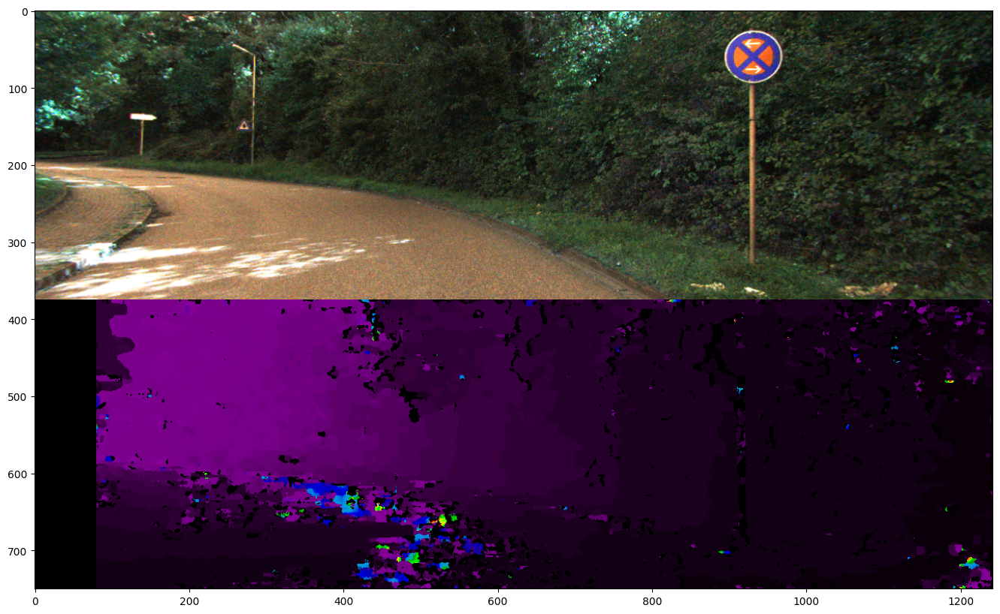

In [84]:
plt.imshow(stacked);

### Best.pt Google Drive에 다운

In [80]:
import shutil

# 디렉터리 압축
shutil.make_archive('/content/drive/MyDrive/detect', 'zip', '/content/runs/detect')

print("압축 완료: /content/drive/MyDrive/detect.zip")


압축 완료: /content/drive/MyDrive/detect.zip
